In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
plt.style.use("grayscale")

In [3]:
df = pd.read_csv("./molecules/roboBohr.csv")

This dataset contains ground state energies of 16,242 molecules calculated by quantum mechanical simulations. The data contains 1277 columns. The first column is unused and the following 1275 columns are features, representing entries in the Coulomb matrix. 

[https://www.kaggle.com/burakhmmtgl/energy-molecule]

The Coulomb matrix is a descriptor which mimics the electrostatic interaction between nuclei, and is calculated with the following equation:
$$
    M_{ij}^{Coulomb} = 
    \begin{cases}
        0.5Z_i^{2.4} & \text{for } i = j \\
        \frac{Z_iZ_j}{R_{ij}} & \text{for } i \neq j
    \end{cases}
$$

The diagonal elements can be seen as the interaction of an atom with itself. The off-diagonal elements represent the Coulomb repulsion between nuclei $i$ and $j$. We don't necessarily need to understand this too deeply.

[https://singroup.github.io/dscribe/tutorials/coulomb_matrix.html]

In [4]:
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,1267,1268,1269,1270,1271,1272,1273,1274,pubchem_id,Eat
0,0,73.516695,17.817765,12.469551,12.458130,12.454607,12.447345,12.433065,12.426926,12.387474,...,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,25004,-19.013763
1,1,73.516695,20.649126,18.527789,17.891535,17.887995,17.871731,17.852586,17.729842,15.864270,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25005,-10.161019
2,2,73.516695,17.830377,12.512263,12.404775,12.394493,12.391564,12.324461,12.238106,10.423249,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25006,-9.376619
3,3,73.516695,17.875810,17.871259,17.862402,17.850920,17.850440,12.558105,12.557645,12.517583,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25009,-13.776438
4,4,73.516695,17.883818,17.868256,17.864221,17.818540,12.508657,12.490519,12.450098,10.597068,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25011,-8.537140


In [5]:
df.shape

(16242, 1278)

Drop the unused columns.

In [6]:
df = df.drop(["Unnamed: 0", "pubchem_id"], axis=1)
df.shape

(16242, 1276)

The Eat column is the atomization energy. 

In [7]:
df.Eat.describe()

count    16242.000000
mean       -11.178969
std          3.659133
min        -23.245373
25%        -13.475805
50%        -10.835211
75%         -8.623903
max         -0.789513
Name: Eat, dtype: float64

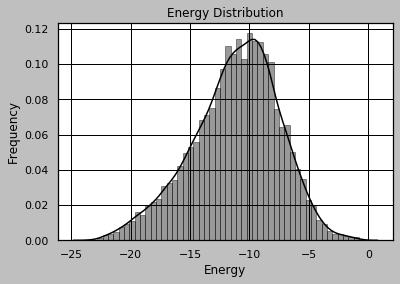

In [8]:
sns.distplot(df["Eat"])
plt.xlabel("Energy")
plt.ylabel("Frequency")
plt.title("Energy Distribution");

In [9]:
X = df.drop("Eat", axis=1).values
X.shape

(16242, 1275)

In [10]:
y = df["Eat"]
y.shape

(16242,)

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, shuffle=True, test_size=0.3)
X_train.shape, X_test.shape

((11369, 1275), (4873, 1275))

In [12]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler().fit(X_train)
Xt = StandardScaler().fit_transform(X)
X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)
X_train_std.shape, X_test_std.shape

((11369, 1275), (4873, 1275))

In [13]:
from sklearn.linear_model import LinearRegression

linear_model = LinearRegression().fit(X_train_std, y_train)
score = {"LinearRegression" : {"Train" : linear_model.score(X_train_std, y_train),
                               "Test"  : linear_model.score(X_test_std, y_test)}}
pd.DataFrame(score)

,LinearRegression
Test,-3685.751532
Train,0.971061


Notice the abysmal test score; this indicates that the model doesn't generalize well at all. Let's try reducing the dimensions. The evolutionary algorithms are sure to be affected by the curse of dimensionality.

0.9944744057096244

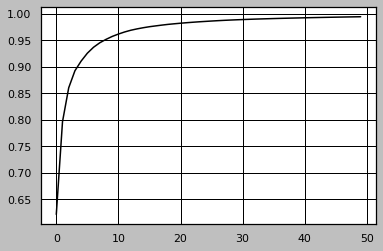

In [14]:
from sklearn.decomposition import PCA

n_components = 50
pca = PCA(n_components=n_components, whiten=True)
Z = pca.fit_transform(Xt)

rng = range(n_components)
plt.plot(rng, [np.cumsum(pca.explained_variance_ratio_)[n] for n in rng])
np.sum(pca.explained_variance_ratio_)

Looks like we can explain almost all of the variance with ~50 components. Let's see how this relates to the energy levels.

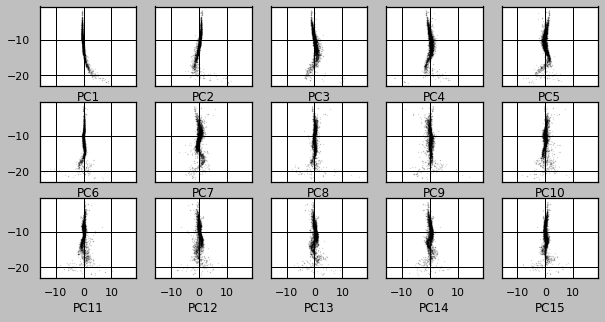

In [15]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(3, 5, sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(15):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)

We will also look at kernel PCA.

In [16]:
from sklearn.decomposition import KernelPCA

mask_random = np.random.randint(0, Xt.shape[0], size=2500)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(Xt[mask_random])
Z = kpca.transform(Xt)
Z.shape

(16242, 50)

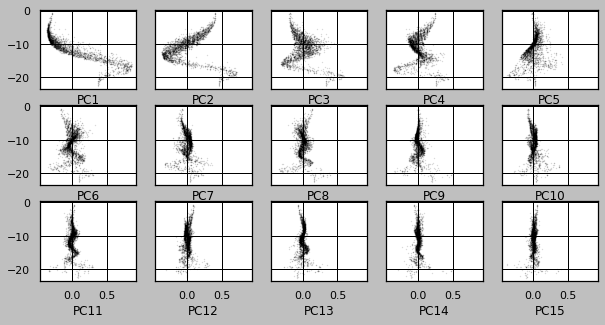

In [17]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(3, 5, sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(15):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)

That looks a lot more interesting!

In [18]:
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [19]:
linear_model = LinearRegression().fit(Z_train, y_train)
score = {"LinearRegression PCA" : {"Train" : linear_model.score(Z_train, y_train),
                                   "Test"  : linear_model.score(Z_test, y_test)}}
pd.DataFrame(score)

,LinearRegression PCA
Test,0.947426
Train,0.948281


In [20]:
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [21]:
linear_model = LinearRegression().fit(Z_train, y_train)
score = {"LinearRegression KPCA" : {"Train" : linear_model.score(Z_train, y_train),
                                    "Test"  : linear_model.score(Z_test, y_test)}}
pd.DataFrame(score)

,LinearRegression KPCA
Test,0.976975
Train,0.978430


We'll write a function to easily evaluate all of our models.

In [22]:
from algorithms import SimpleESRegressor
from algorithms import GeneticESRegressor
from algorithms import NaturalESRegressor
from algorithms import DifferentialEvolutionRegressor

def score(objective, iterations=250):
    bounds = np.array([(-20, 20)] * (1 + Z_train.shape[1]))

    ses = SimpleESRegressor(objective=objective, n_iter=iterations, random_state=0)
    ges = GeneticESRegressor(objective=objective, n_iter=iterations, random_state=0)
    nes = NaturalESRegressor(objective=objective, n_iter=iterations, random_state=0)
    dev = DifferentialEvolutionRegressor(objective=objective, n_iter=iterations * 10, random_state=0, bounds=bounds)

    ses.fit(Z_train, y_train)
    ges.fit(Z_train, y_train)
    nes.fit(Z_train, y_train)
    dev.fit(Z_train, y_train)

    fig, axes = plt.subplots(2, 2, figsize=(10, 10), subplot_kw={"yticks": ()})
    axes[0][0].set_title("Simple ES")
    axes[0][0].plot(range(iterations), ses.history_)
    axes[0][1].set_title("Genetic ES")
    axes[0][1].plot(range(iterations), ges.history_)
    axes[1][0].set_title("Natural ES")
    axes[1][0].plot(range(iterations), nes.history_)
    axes[1][1].set_title("Differential Evolution")
    axes[1][1].plot(range(iterations * 10), dev.history_)

    score = {"SimpleES" : {"Train" : ses.score(Z_train, y_train),
                           "Test"  : ses.score(Z_test, y_test)},
             "GeneticES" : {"Train" : ges.score(Z_train, y_train),
                            "Test"  : ges.score(Z_test, y_test)},
             "NaturalES" : {"Train" : nes.score(Z_train, y_train),
                            "Test"  : nes.score(Z_test, y_test)},
             "DifferentialEvolution" : {"Train" : dev.score(Z_train, y_train),
                                        "Test"  : dev.score(Z_test, y_test)}}
    return pd.DataFrame(score)

In [23]:
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

100%|██████████| 2500/2500 [00:31<00:00, 79.47it/s]


,SimpleES,GeneticES,NaturalES,DifferentialEvolution
Train,0.672327,0.855402,0.935089,0.948277
Test,0.688606,0.852867,0.933963,0.947425


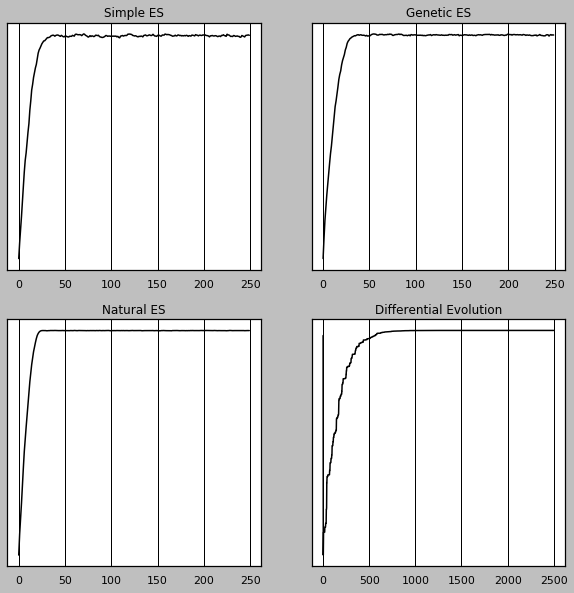

In [24]:
from objectives import RSSObjective

score(RSSObjective())

It looks like each algorithm has converged on some local optimum, with some doing better than others. We could play around with the parameters for each, but for now we'll increase the number of iterations and use the kernel PCA transformed data.

In [27]:
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

100%|██████████| 5000/5000 [01:05<00:00, 76.56it/s]


,SimpleES,GeneticES,NaturalES,DifferentialEvolution
Train,0.976328,0.977582,0.963258,0.978430
Test,0.976655,0.978197,0.963981,0.977017


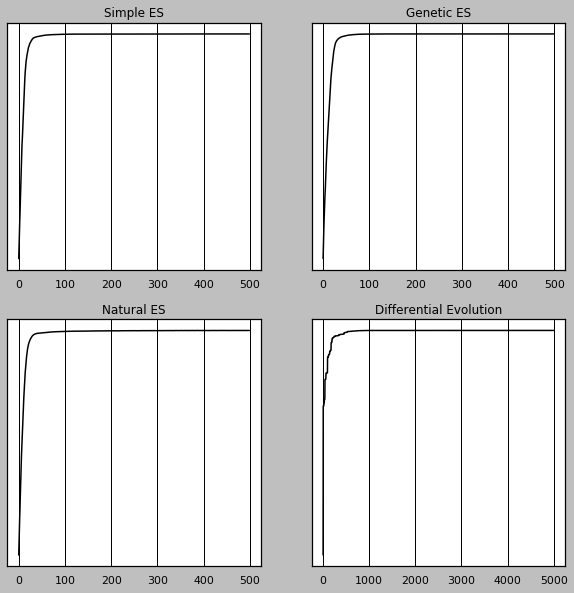

In [28]:
score(RSSObjective(), iterations=500)